In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from matplotlib.animation import FuncAnimation


# Exercise 1: Calculation of π

When we use Monte Carlo to perform a molecular simulation, we are actually evaluating a configurational integral or partition function [Frenkel and Smit, 2002; Dubbeldam, 2013].

In mathematics, Monte Carlo is a common numerical algorithm to compute integrals (or the volume under a function) using random numbers instead of a regular grid. As a first example, we will use Monte Carlo to estimate π.

Consider a circle of diameter *d* surrounded by a square of length *l* (*l ≥ d*). Random coordinates within the square are generated. The value of π can be calculated from the fraction of points that fall within the circle.

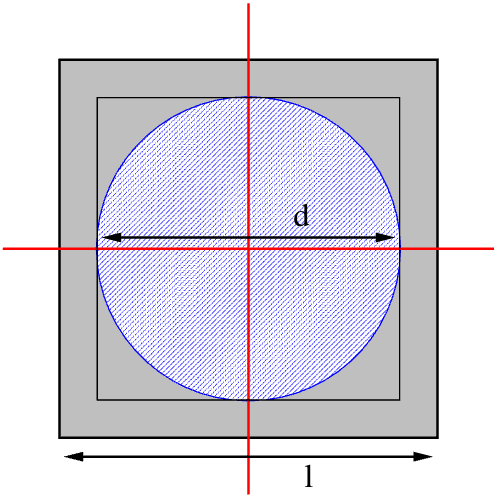

**Figure:** A ciricle of diameter $d$ surrounded by a square of length $l(l \geq d)$

### Question 1: 
1.How can π be calculated from the fraction of points that fall in the circle? Suggest a workflow to estimate $\pi$ from the fraction of points that fall in the first quarant $(x \in [0,l/2], y \in [0,l/2])$ of the circle. 
Complete the small Monte Carlo program to calculate $\pi$ using this method.
Remark: the “exact” value of π can be computed numerically using π = 4 × arctan (1).

**Answer**

To estimate the value of pi from the fraction of points that fall within the first quadrant of the circle, we can use the following workflow:

1. Generate random coordinates within the portion of the square that corresponds to the first quadrant of the circle.
2. We know the ratio of the areas is given by:
$$
\begin{align*}
    \frac{\frac{\pi d}{2}}{\left(\frac{l}{2}\right)^2} &= \frac{\text{\# points in circle}}{\text{\# points in sqaure}} \\
    \frac{\pi d^2}{4l^2} &= \frac{\text{\# points in circle}}{\text{\# points in sqaure}} \\
    \pi &= \frac{4l^2 \times \text{\# points in circle}}{d^2 \times \text{\# points in sqaure}}
\end{align*}
$$

In [2]:
numberOfPoints = 1000
l = 1.0
d = 1.0

x_coordinates = np.random.uniform(0, 1, numberOfPoints)
y_coordinates = np.random.uniform(0, 1, numberOfPoints)
x_scaled = l * x_coordinates / 2
y_scaled = l * y_coordinates / 2

# start refactor
distances = np.sqrt((x_scaled)**2 + (y_scaled)**2)
insideCircle = distances <= d / 2
piEstimate = (4 * l**2 * np.sum(insideCircle)) / (d**2 * numberOfPoints)
# end refactor

print(f"Score = {np.sum(insideCircle)} / {numberOfPoints} ({100 * np.mean(insideCircle):6.2f} %)")
print(r"π =", piEstimate)

Score = 790 / 1000 ( 79.00 %)
π = 3.16


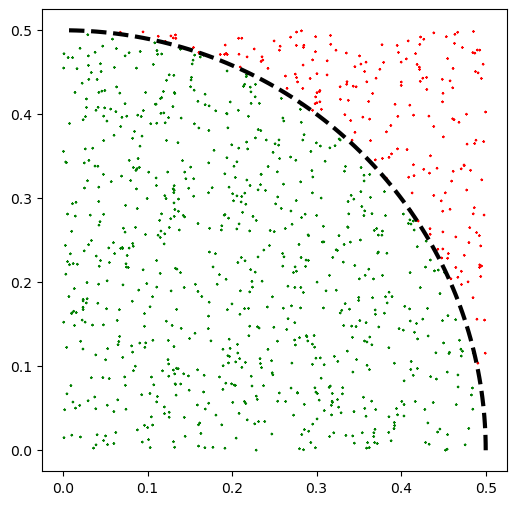

In [3]:
fig, ax = plt.subplots(figsize=(6, 6))

if insideCircle is not None:
    cmap = np.array(["red", "green"])
    ax.scatter(x_scaled, y_scaled, s=1, marker="x", c=cmap[insideCircle.astype(np.int32)])
else:
    ax.scatter(x_scaled, y_scaled, s=1, marker="x", c="red")


s = np.linspace(0, 0.5 * np.pi, 100)
ax.plot(0.5 * d * np.cos(s), 0.5 * d * np.sin(s), c="black", lw=3, ls="--")

<div style="max-width: 1000px; margin-left: 0; margin-right: auto; font-size: 20px; line-height: 1.6;">

2.How would you expect the accuracy of the result depends on the ratio $l/d$ and the number of generated coordinates?

The more points we generate, the more accurate the result will be. My calculations above assume that $\frac{l}{d} = 1$. However, if this is not the case then we will get inaccurate results without including a correction factor to account for this mismatch

### Question 2:
1.Derive a formula to calculate the relative standard deviation of the estimate of $\pi$. Hint: the distribution of successful hits is binomial. Is there an optimal ratio?

**Answer**

We can model the probability of $X$ points landing inside the circle as a binomial distribution:
$$
    X \sim \text{Binomial}(N, p)
$$
Where $N$ is the total number of points and the $p = \frac{\pi d^2}{4l^2}$ is the probability of landing inside the circle.

Then our estimator for $\pi$ is given by:

$$
    \hat{\pi} = \frac{4l^2}{d^2}\frac{X}{N}
$$

To calculate the relative standard deviation we first need to compute the expectef value and the variance of this estimator. The expected value of $\hat{\pi}$ is given by:
$$
\begin{align*}
    \mathbb{E}[\hat{\pi}] &= \mathbb{E}\left[\frac{4l^2X}{d^2N}\right] \\
                          &= \frac{4l^2}{d^2}\mathbb{E}\left[\frac{X}{N}\right] \\
                          &= \frac{4l^2\pi d^2}{4l^2d^2} \\
                          &= \pi \\
\end{align*}
$$
So in expectation we converge to the right value. Now let's compute the variance in this estimator:
$$
\begin{align*}
    \operatorname{Var}(\hat{\pi}) &= \operatorname{Var}\left(\frac{4l^2X}{Nd^2}\right) \\
                                  &= \frac{16l^4}{N^2d^4}\operatorname{Var}\left(X\right) \\
                                  &= \frac{16l^4}{N^2d^4}Np(1-p) \\
                                  &= \frac{16l^4}{Nd^4}\frac{\pi d^2}{4l^2}(1-\frac{\pi d^2}{4l^2}) \\
\end{align*}
$$
Now to compute the relative standard deviation we can use the formula:
$$
\begin{align*}
    \operatorname{RSD}(\hat{\pi}) &= \frac{\sigma_{\hat{\pi}}}{\mathbb{E}(\hat{\pi})} \\
                                  &= \frac{1}{\pi}\sqrt{\frac{16l^4}{Nd^4}\frac{\pi d^2}{4l^2}(1-\frac{\pi d^2}{4l^2})} \\
                                  &\boxed{= \frac{1}{\pi}\frac{2l}{d}\sqrt{\frac{1}{N}(1- \frac{\pi d^2}{4l^2})}}
\end{align*}
$$

Let us then define $r = \frac{l}{d}$ and sub it into our equation:
$$
\begin{align*}
    \operatorname{RSD}(\hat{\pi}) & = \frac{1}{\pi}2r\sqrt{\frac{1}{N}(1-\frac{\pi}{4r^2})}
\end{align*}
$$

The minimizer of this expression that still leaves $l \geq d$ is when $l=d$ meaning that $r=1$

In [4]:
def theoreticalStandardDeviation(n):
    # Compute the theoretical standard error of the mean of n points
    # start refactor
    return 2*np.sqrt((1/n) * (1 - np.pi/4)) / np.sqrt(n)
    # end refactor

In [5]:
numberOfPoints = 100
numberOfRuns = 100
l = 1.0
d = 1.0

x_coordinates = np.random.uniform(0, 1, (numberOfRuns, numberOfPoints))
y_coordinates = np.random.uniform(0, 1, (numberOfRuns, numberOfPoints))
x_scaled = l * x_coordinates / 2
y_scaled = l * y_coordinates / 2

# start refactor
distances = np.sqrt(x_scaled**2 + y_scaled**2)
insideCircle = distances <= d / 2
piEstimates = (4 * l**2 * np.sum(insideCircle)) / (d**2 * (numberOfPoints*numberOfRuns))
# end refactor

print(f"Score = {np.sum(insideCircle)} / {numberOfPoints*numberOfRuns} ({100 * np.mean(insideCircle):6.2f} %)")
print(f"Theoretical standard deviation: {theoreticalStandardDeviation(numberOfPoints):8.6f}")
print(f"π = {np.mean(piEstimates):10.8f} ± {np.std(piEstimates):8.6f}")

Score = 7830 / 10000 ( 78.30 %)
Theoretical standard deviation: 0.009265
π = 3.13200000 ± 0.000000


### Question 3:
1.Is it a good idea to calculate many decimals of $\pi$ using this method?

No because this lies purely on random chance. It would be a much better idea to use one of the derminisitc formulas for $\pi$ such as the Chudnovsky formula

In [6]:
from tqdm.auto import tqdm
# Precompute means and standard deviations
max_points = 100000
n_runs = 1000  # Number of independent runs
l = 1
d = 1
x_all = np.random.uniform(0, 1, (n_runs, max_points))
y_all = np.random.uniform(0, 1, (n_runs, max_points))
x_all_box_l, y_all_box_l = x_all * l / 2, y_all * l / 2

# Precompute distances and inside_circle (array of bools) for all points
distances = np.sqrt(x_all_box_l**2 + y_all_box_l**2)
inside_circle = distances <= d / 2

# Precompute π estimates for all points and all runs
cumulative_inside_circle = np.cumsum(inside_circle, axis=1)

# start refactor
n = np.arange(1, max_points + 1).reshape(1, -1)  # Shape (1, max_points)
pi_estimates_all = 4 * cumulative_inside_circle / n  # Shape (n_runs, max_points)

# Compute the mean and standard deviation across runs for each sample size
means = np.mean(pi_estimates_all, axis=0)
std_devs = np.std(pi_estimates_all, axis=0)
# end refactor

# Initialize plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Quarter Circle Visualization
ax1.set_title("Quarter Circle (First Quadrant)")
ax1.set_xlim(0, l / 2)
ax1.set_ylim(0, l / 2)
circle = Circle((0, 0), d / 2, color="blue", fill=False)
ax1.add_artist(circle)
scat = ax1.scatter([], [], s=1)

# Pi Estimation Plot
ax2.set_title("Estimation of Pi")
ax2.set_xlim(1, max_points)
ax2.set_ylim(2.5, 4)
ax2.set_xscale("log")
(line_mean,) = ax2.plot([], [], color="b", label="Mean Pi Estimate")
true_pi_line = ax2.axhline(y=np.pi, color="r", linestyle="-", label="True Pi")
n = np.arange(1, max_points, 1)
if theoreticalStandardDeviation(n) is not None:
    true_std = ax2.plot(n, np.pi + theoreticalStandardDeviation(n), label="theoretical_StdErr")
fill_std = ax2.fill_between([], [], [], color="gray", alpha=0.3)
ax2.legend()


# Update function for animation
def update(frame):
    num_points = frame + 1

    # Update scatter plot
    x = x_all_box_l[0, :num_points]
    y = y_all_box_l[0, :num_points]
    colors = np.where(inside_circle[0, :num_points], "green", "red")
    scat.set_offsets(np.c_[x, y])
    scat.set_color(colors)

    # Update mean Pi estimate plot
    line_mean.set_data(range(1, num_points + 1), means[:num_points])

    # Update standard deviation fill
    global fill_std
    fill_std.remove()
    fill_std = ax2.fill_between(
        range(1, num_points + 1),
        means[:num_points] - std_devs[:num_points],
        means[:num_points] + std_devs[:num_points],
        color="gray",
        alpha=0.3,
    )


n_frames = 20  # Number of frames to show in the animation


# Generate a nonlinear frame progression
def nonlinear_frame_progression(n_frames, max_points):
    base = np.geomspace(1, max_points - 1, n_frames // 2, dtype=int)  # Logarithmic-like steps
    fine = np.unique(np.linspace(1, max_points - 1, n_frames // 2, dtype=int))  # Linear steps
    return np.unique(np.sort(np.concatenate((base, fine))))


# Generate the frame indices
frame_indices = nonlinear_frame_progression(n_frames, max_points)
# Animation
ani = FuncAnimation(fig, update, frames=frame_indices, interval=50, repeat=False)

# Display the animation inline in Jupyter Notebook
from IPython.display import HTML

plt.close(fig)
HTML(ani.to_jshtml())

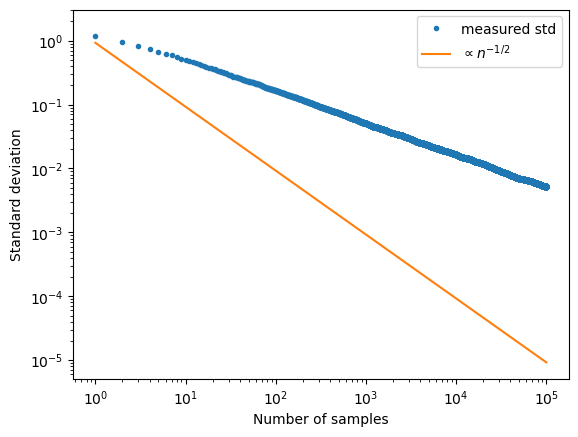

In [7]:
# Plot the standard deviation of the mean of n points
points = np.arange(1, max_points)
plt.plot(std_devs, ".", label="measured std")
plt.plot(points, theoreticalStandardDeviation(points), label=r"$\propto n^{-1/2}$")
plt.yscale("log")
plt.xscale("log")
plt.xlabel("Number of samples")
plt.ylabel("Standard deviation")
plt.legend()

### Question 4:
1.How would the computation of $\pi$ change when going to 3d or 4d.

**Answer**
The process will be exactly the same as before. We compute the ratio of the volume of the hypersphere in the positive orthant to the volume of the hypercube in the positive orthant and then rearrange the equation for $\pi$. 

If we let $n$ be the dimension, we get
$$

    \pi \approx \left(\frac{\Gamma(\frac{n}{2}+1)l^n\times\text{\# points in the circle}}{d^{n}\times\text{\# total number of points}}\right)^{\frac{2}{n}}

$$

In [14]:
import math
def estimate_pi_monte_carlo(n_dim: int, num_samples: int) -> float:
    # Generate random points in the n-dimensional unit cube
    points = np.random.uniform(0, 1, (num_samples, n_dim))
    distances = np.sqrt(np.sum(points**2, axis=1))

    # start refactor
    inside_sphere = distances <= 1
    # end refactor
    fraction = np.sum(inside_sphere) / num_samples
    volume_estimate = (1 ** n_dim) * fraction  # volume of the positive orthant cube is 1^d = 1
    volume_estimate_full_sphere = 2 ** n_dim * volume_estimate
    estimated_pi = (math.gamma(n_dim/2 + 1) * volume_estimate_full_sphere) ** (2/n_dim)

    # # Calculate pi based on dimensionality
    # if n_dim == 2:
    #     # start refactor
    #     estimated_pi = None
    #     # end refactor
    # elif n_dim == 3:
    #     # start refactor
    #     estimated_pi = None
    #     # end refactor
    # elif n_dim == 4:
    #     # start refactor
    #     estimated_pi = None
    #     # end refactor
    # else:
    #     raise ValueError("We look at 2D,3D and 4D only.")

    return estimated_pi


# Estimate pi in 2D, 3D and 4D
num_samples = 100000

pi_2d = estimate_pi_monte_carlo(2, num_samples)
print(f"Estimated pi in 3D: {pi_2d}")

pi_3d = estimate_pi_monte_carlo(3, num_samples)
print(f"Estimated pi in 3D: {pi_3d}")

pi_4d = estimate_pi_monte_carlo(4, num_samples)
print(f"Estimated pi in 4D: {pi_4d}")


pi_10d = estimate_pi_monte_carlo(10, num_samples)
print(f"Estimated pi in 4D: {pi_10d}")

Estimated pi in 3D: 3.14204
Estimated pi in 3D: 3.1335123532543157
Estimated pi in 4D: 3.144722563279629
Estimated pi in 4D: 3.144012342386491


<div style="max-width: 1000px; margin-left: 0; margin-right: auto; font-size: 20px; line-height: 1.6;">

### Possible additional questions: Question 5:
1.Why are Monte Carlo methods particularly effective in higher dimensions compared to traditional numerical integration techniques?

Explain how the complexity of traditional integration methods scales with the number of dimensions (e.g., 2D, 3D, 4D).

Highlight the need for exponentially more grid points in traditional methods as dimensions increase.
Discuss the “curse of dimensionality” and its impact on grid-based approaches.
How does the Monte Carlo method avoid this issue?

Explain how Monte Carlo sampling operates independently of dimensionality.
Discuss the convergence rate of Monte Carlo methods which scales as $\mathcal{O}(1/\sqrt{n})$
 and why it remains effective even in higher dimensions.


**Answer**

In higher dimensions, the number of grid points required for accurate integration may become prohibitively large, especially when the dimensionality is high. This is known as the "curse of dimensionality". Assume you are integrating over a function $f(x)$ in $d$ dimensions over a bounded region [0, 1] with a step size of 0.1. For $d$ dimensions you will need to evaluate the function $10^d$ times. For $k$ points with grid sampling we get a complexity of $\mathcal{O}(k^d)$

Monte Carlo approaches avoid this by generating random points according to some distribution and then evaluate the integarl as:

$$
    I = \sum_{i=0}^ {N}f(x_i) \cdot \operatorname{Vol}(D)
$$

where $D$ is the volume of the domain. With Monte Carlo methods we only get a complexity of $\mathcal{O}(k)$ for $k$ points. 

We know the error rate of Monte Carlo methods scales as $\mathcal{O}\left(\frac{1}{\sqrt{n}}\right)$ which means we need a lot of points to get good accuracy. There are other methods such as the Trapesoidal rule which has an error rate of $\mathcal{O}(k^{-2})$, however in higher dimensions number of functions evaluations needed far outpace this good error rate. In low dimensions this doesn't make sense since we would need to sample a larger number of points to get the error rate down and then other integrations schemes would be better. But in high dimensions monte carlo sampling will be better since it's complexity is independant of the dimension size.